# Intro

In this notebook, we 'll build a CNN using Keras to classify thousands of pictures in six different categories ( buildings, forest, glacier, mountain, sea, street ).

A **Convolutional Neural Network (CNN)** is a type of deep learning algorithm that is particularly well-suited for image recognition and processing tasks. It is made up of multiple layers, including convolutional layers, pooling layers, and fully connected layers.

# Load Packages

In [1]:
import warnings
warnings.filterwarnings("ignore")

import os 
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import glob as gb
import cv2

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Load and explore data

The Train, Test and Prediction data is separated in each zip files. There are around 14k images in Train, 3k in Test and 7k in Prediction.

In [2]:
trainpath = '../input/intel-image-classification/seg_train/seg_train'
testpath = '../input/intel-image-classification/seg_test/seg_test'
predpath = '../input/intel-image-classification/seg_pred/seg_pred'

In [3]:
class_names = os.listdir(trainpath)
class_names

['mountain', 'street', 'buildings', 'sea', 'forest', 'glacier']

## Train Data

In [4]:
# check out number of images in each folder in training data

NoTrImgs = 0
NoClsImgs = []
for folder in os.listdir(trainpath):
    images = len([i for i in os.listdir(os.path.join(trainpath, folder)) if i.endswith('.jpg')])
    NoClsImgs.append(images)
    print(f'For train data, found {images} in folder {folder}')
    NoTrImgs += images

For train data, found 2512 in folder mountain
For train data, found 2382 in folder street
For train data, found 2191 in folder buildings
For train data, found 2274 in folder sea
For train data, found 2271 in folder forest
For train data, found 2404 in folder glacier


In [5]:
print(f'The number of images in train data is: {NoTrImgs}')

The number of images in train data is: 14034


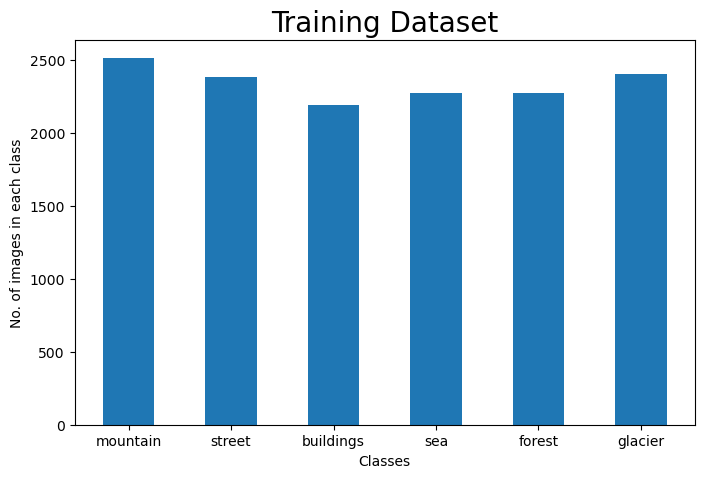

In [6]:
plt.figure(figsize=(8, 5))
plt.bar(class_names, NoClsImgs, width=0.5)
plt.xlabel('Classes')
plt.ylabel('No. of images in each class')
plt.title('Training Dataset', fontsize=20)
plt.show()

**Now check the shape of images**

In [7]:
size = []
for folder in os.listdir(trainpath):
    files = gb.glob(pathname=str(os.path.join(trainpath, folder) + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        size.append(image.shape)
        
print(pd.Series(size).value_counts()) # Print a Series containing counts of unique values.

(150, 150, 3)    13986
(113, 150, 3)        7
(111, 150, 3)        3
(135, 150, 3)        3
(143, 150, 3)        2
(108, 150, 3)        2
(146, 150, 3)        2
(142, 150, 3)        2
(123, 150, 3)        2
(136, 150, 3)        2
(134, 150, 3)        2
(144, 150, 3)        2
(81, 150, 3)         1
(149, 150, 3)        1
(119, 150, 3)        1
(76, 150, 3)         1
(120, 150, 3)        1
(97, 150, 3)         1
(105, 150, 3)        1
(141, 150, 3)        1
(110, 150, 3)        1
(133, 150, 3)        1
(115, 150, 3)        1
(145, 150, 3)        1
(140, 150, 3)        1
(124, 150, 3)        1
(103, 150, 3)        1
(100, 150, 3)        1
(131, 150, 3)        1
(147, 150, 3)        1
(102, 150, 3)        1
dtype: int64


## Test Data

In [8]:
# check out number of images in each folder in testing data

NoTsImgs = 0
NoClsImgs = []
for folder in os.listdir(testpath):
    images = len([i for i in os.listdir(os.path.join(testpath, folder)) if i.endswith('.jpg')])
    NoClsImgs.append(images)
    print(f'For test data, found {images} in folder {folder}')
    NoTsImgs += images

For test data, found 525 in folder mountain
For test data, found 501 in folder street
For test data, found 437 in folder buildings
For test data, found 510 in folder sea
For test data, found 474 in folder forest
For test data, found 553 in folder glacier


In [9]:
print(f'The number of images in test data is: {NoTsImgs}')

The number of images in test data is: 3000


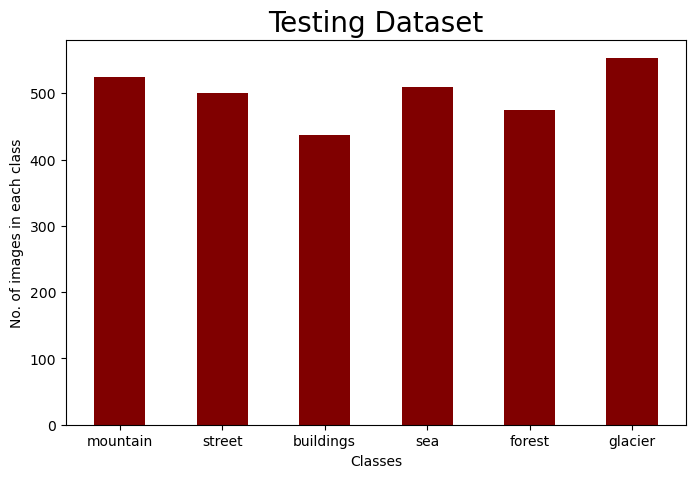

In [10]:
plt.figure(figsize=(8, 5))
plt.bar(class_names, NoClsImgs, width=0.5, color='maroon')
plt.xlabel('Classes')
plt.ylabel('No. of images in each class')
plt.title('Testing Dataset', fontsize=20)
plt.show()

**Now check the shape of images**

In [11]:
size = []
for folder in os.listdir(testpath):
    files = gb.glob(pathname=str(os.path.join(testpath, folder) + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        size.append(image.shape)
        
print(pd.Series(size).value_counts()) 

(150, 150, 3)    2993
(81, 150, 3)        1
(131, 150, 3)       1
(141, 150, 3)       1
(149, 150, 3)       1
(110, 150, 3)       1
(76, 150, 3)        1
(72, 150, 3)        1
dtype: int64


## Prediction Data

In [12]:
# check out number of images in prediction data

images = len([i for i in os.listdir(predpath) if i.endswith('.jpg')])
print(f'for prediction data found {images}')

for prediction data found 7301


**Now check the shape of images**

In [13]:
size = []
files = gb.glob(pathname=str(predpath + '/*.jpg'))
for file in files:
    image = cv2.imread(file)
    size.append(image.shape)
    
print(pd.Series(size).value_counts())

(150, 150, 3)    7288
(139, 150, 3)       1
(108, 150, 3)       1
(129, 150, 3)       1
(143, 150, 3)       1
(149, 150, 3)       1
(144, 150, 3)       1
(133, 150, 3)       1
(112, 150, 3)       1
(100, 150, 3)       1
(374, 500, 3)       1
(126, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
dtype: int64


# Data Preprocessing

Now we 'll read all pictures and label it 

In [14]:
s = 100    # we 'll use it to reshape the pictures

In [15]:
class_names_label = {class_names:i for i, class_names in enumerate(class_names)}
class_names_label

{'mountain': 0,
 'street': 1,
 'buildings': 2,
 'sea': 3,
 'forest': 4,
 'glacier': 5}

In [16]:
# this function will return the name of class when give it number from 0 to 5
def get_label(n):  
    for key, value in class_names_label.items():
        if n == value:
            return key

In [17]:
# read all pictures in training data and label it

X_train = []
y_train = []

for folder in os.listdir(trainpath):
    files = gb.glob(pathname=str(os.path.join(trainpath, folder) + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image, (s, s))
        X_train.append(list(image_array))
        y_train.append(class_names_label[folder])
        
print(len(X_train))

14034


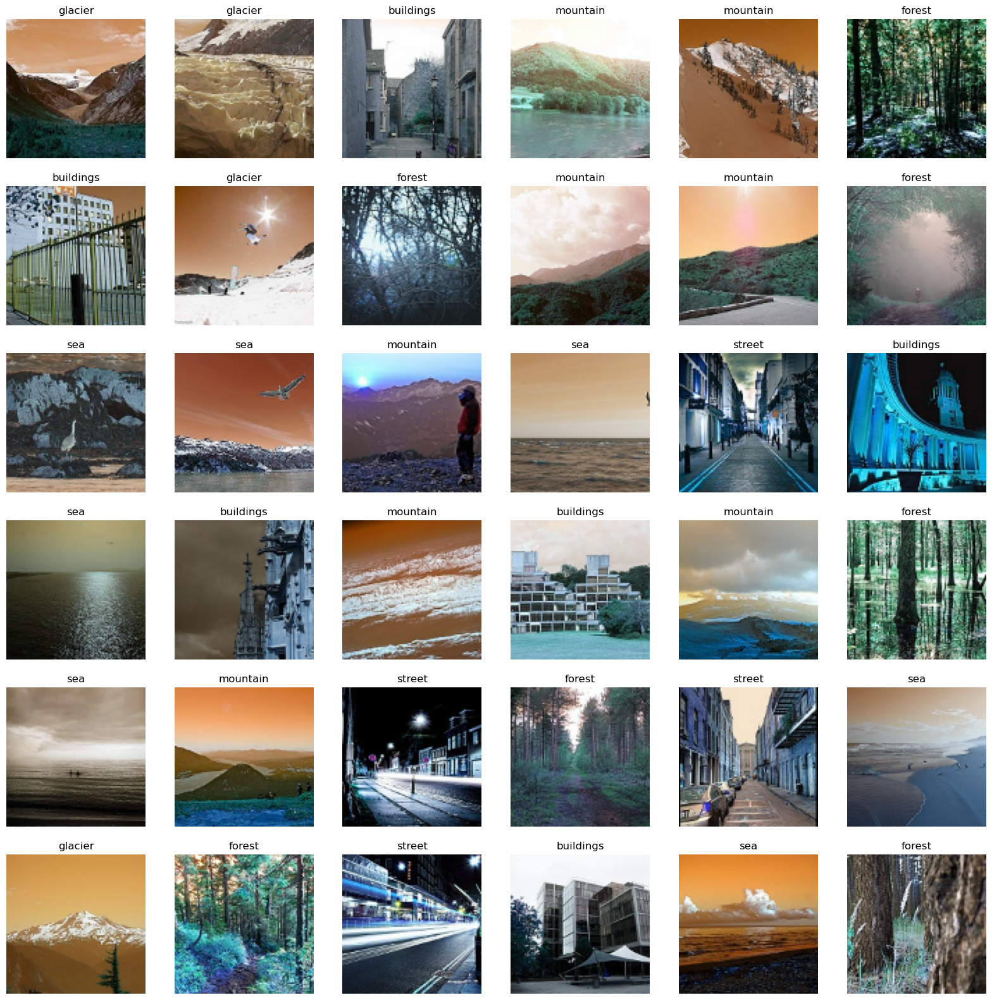

In [18]:
# Let's show some random pictures in train data

plt.figure(figsize=(20, 20))
for n, i in enumerate(list(np.random.randint(0, len(X_train), 36))): # n -> index , i -> random numbers
    plt.subplot(6, 6, n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(get_label(y_train[i]))

In [19]:
# read all pictures in testing data and label it

X_test = []
y_test = []

for folder in os.listdir(testpath):
    files = gb.glob(pathname=str(os.path.join(testpath, folder) + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image, (s, s))
        X_test.append(list(image_array))
        y_test.append(class_names_label[folder])
        
print(len(X_test))

3000


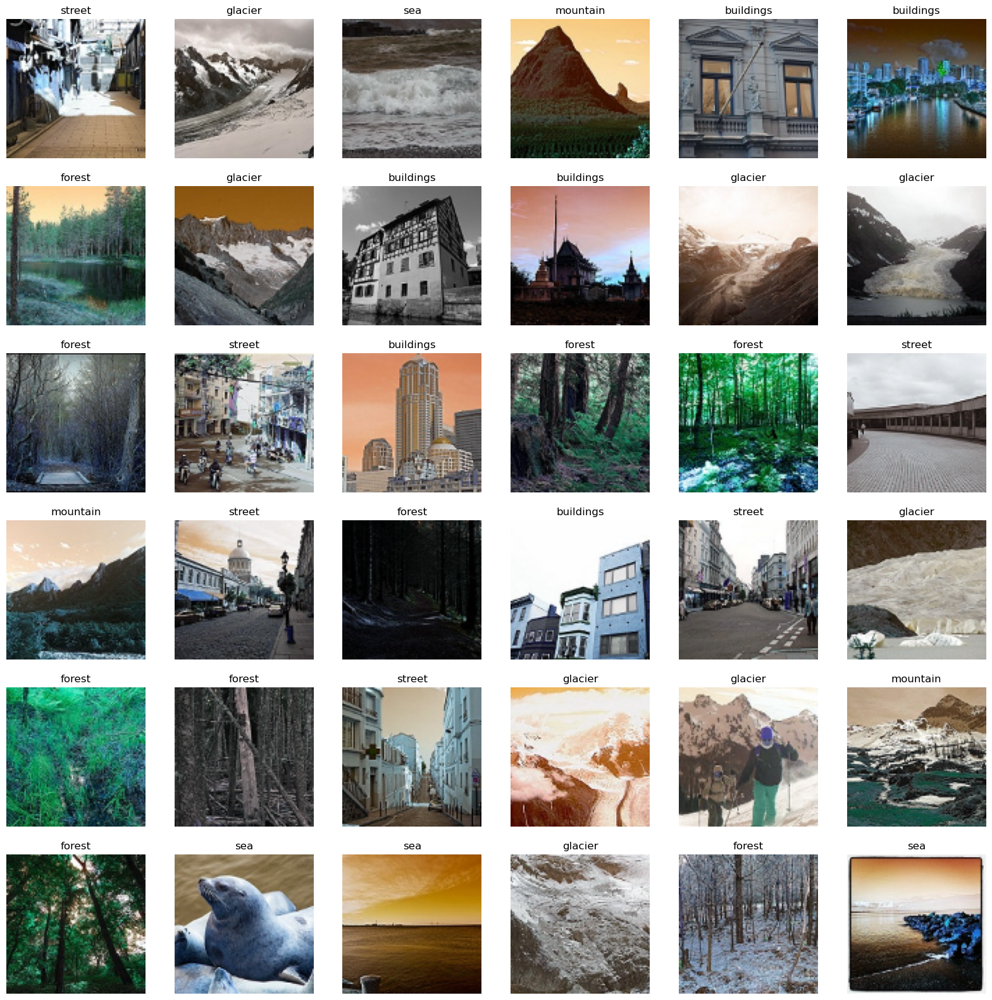

In [20]:
# Let's show some random pictures in X_test

plt.figure(figsize=(20, 20))
for n, i in enumerate(list(np.random.randint(0, len(X_test), 36))): # n -> index , i -> random numbers
    plt.subplot(6, 6, n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(get_label(y_test[i]))

In [21]:
# Prediction data

X_pred = []
files = gb.glob(pathname=str(predpath + '/*.jpg'))
for file in files:
    image = cv2.imread(file)
    image_array = cv2.resize(image, (s, s))
    X_pred.append(list(image_array))
print(len(X_pred))

7301


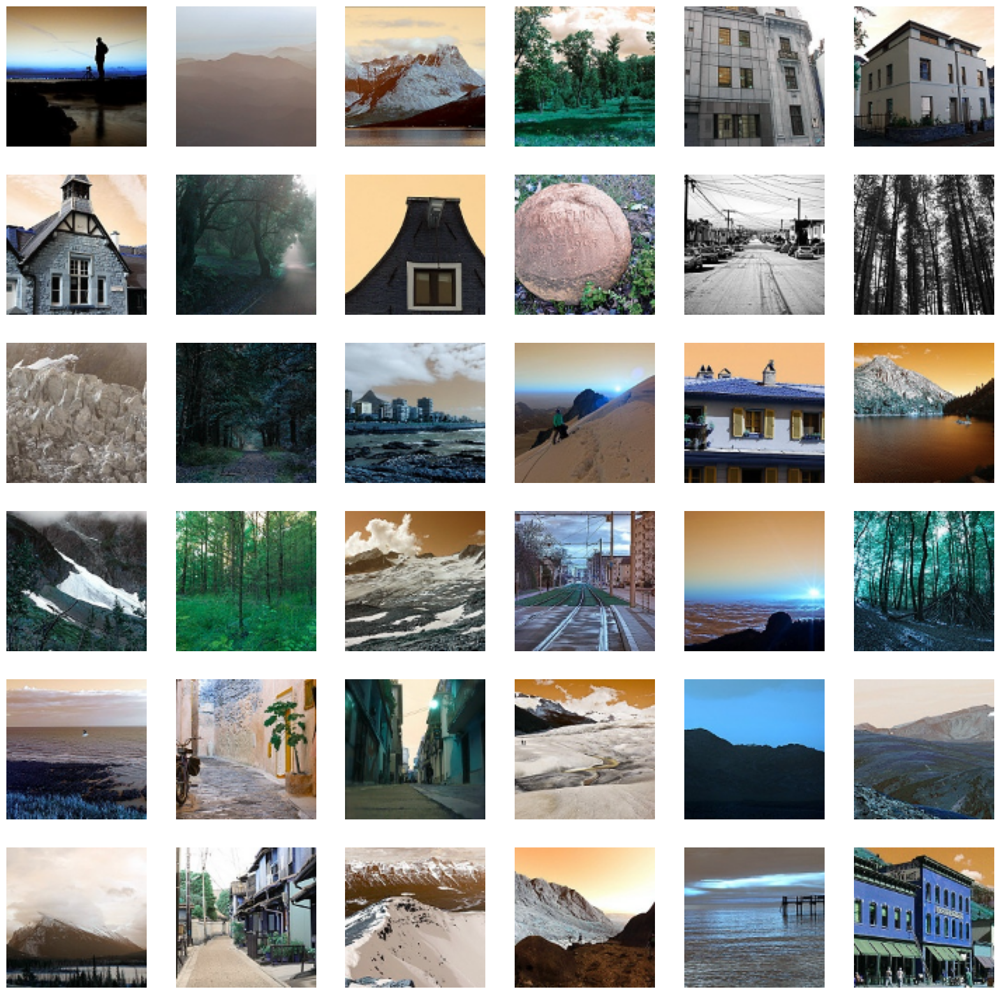

In [22]:
# Let's show some random pictures in X_pred

plt.figure(figsize=(20, 20))
for n, i in enumerate(list(np.random.randint(0, len(X_pred), 36))):
    plt.subplot(6, 6, n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')

In [23]:
# Convert the data into arrays using numpy

X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

In [24]:
print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)


## Data Scaling

In [25]:
X_train = X_train / 255
X_test = X_test / 255
X_pred = X_pred / 255

# Build the model

In [26]:
# Now build the CNN model by Keras, using Conv2D layers, MaxPooling and Denses

CNN_model = Sequential()

CNN_model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(s, s, 3)))
CNN_model.add(MaxPooling2D())

CNN_model.add(Conv2D(32, (3, 3), activation='relu'))
CNN_model.add(MaxPooling2D())

CNN_model.add(Conv2D(16, (3, 3), activation='relu'))
CNN_model.add(MaxPooling2D())

CNN_model.add(Flatten())

CNN_model.add(Dense(128, activation='relu'))
CNN_model.add(Dense(6, activation='softmax'))  # output layer with 6 classes

In [27]:
# now to compile the model, using adam optimizer , & sparse categorical crossentropy loss

CNN_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
                 loss='sparse_categorical_crossentropy', 
                 metrics=['accuracy'])

In [28]:
# Show some details about model
CNN_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 98, 98, 32)        896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 49, 49, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 47, 47, 32)        9248      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 23, 23, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 21, 21, 16)        4624      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 10, 10, 16)       0

# Train the model

In [29]:
EPOCHS = 30
history = CNN_model.fit(X_train, y_train, epochs=EPOCHS, validation_data=(X_test, y_test))

Epoch 1/30
439/439 [==============================] - 13s 10ms/step - loss: 1.0173 - accuracy: 0.6119 - val_loss: 0.8377 - val_accuracy: 0.6850
Epoch 2/30
439/439 [==============================] - 3s 7ms/step - loss: 0.7731 - accuracy: 0.7182 - val_loss: 0.7398 - val_accuracy: 0.7403
Epoch 3/30
439/439 [==============================] - 3s 7ms/step - loss: 0.6472 - accuracy: 0.7648 - val_loss: 0.7260 - val_accuracy: 0.7293
Epoch 4/30
439/439 [==============================] - 3s 7ms/step - loss: 0.5677 - accuracy: 0.7967 - val_loss: 0.5833 - val_accuracy: 0.7917
Epoch 5/30
439/439 [==============================] - 3s 7ms/step - loss: 0.5020 - accuracy: 0.8215 - val_loss: 0.5886 - val_accuracy: 0.7883
Epoch 6/30
439/439 [==============================] - 3s 7ms/step - loss: 0.4400 - accuracy: 0.8431 - val_loss: 0.6342 - val_accuracy: 0.7757
Epoch 7/30
439/439 [==============================] - 3s 7ms/step - loss: 0.3845 - accuracy: 0.8599 - val_loss: 0.6526 - val_accuracy: 0.7973
Epoc

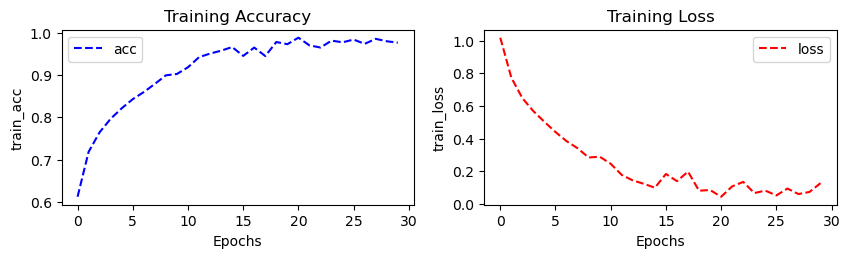

In [30]:
# Plot the accuracy and loss during the training

fig = plt.figure(figsize=(10, 5))

plt.subplot(221)
plt.plot(history.history['accuracy'], 'b--', label='acc')
plt.xlabel('Epochs')
plt.ylabel('train_acc')
plt.title('Training Accuracy')
plt.legend()

plt.subplot(222)
plt.plot(history.history['loss'], 'r--', label='loss')
plt.xlabel('Epochs')
plt.ylabel('train_loss')
plt.title('Training Loss')
plt.legend()

plt.show()

In [31]:
Loss, Accuracy = CNN_model.evaluate(X_test, y_test)
print('Loss = ', Loss)
print('Accuracy = ', Accuracy)

94/94 [==============================] - 0s 3ms/step - loss: 2.0818 - accuracy: 0.7270
Loss =  2.0818378925323486
Accuracy =  0.7269999980926514


In [32]:
y_pred = CNN_model.predict(X_test)
y_pred.shape

94/94 [==============================] - 0s 2ms/step


(3000, 6)

In [33]:
result = CNN_model.predict(X_pred)
result.shape

229/229 [==============================] - 1s 3ms/step


(7301, 6)